In [1]:
import torch
import torch.optim as optim
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torch.utils.data import Dataset
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import random
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold, KFold, cross_val_score
from sklearn.metrics import accuracy_score, mean_squared_error
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from xgboost import XGBRegressor, XGBClassifier
from tqdm.auto import tqdm
import os

In [2]:
# change working dir to my Google drive
from google.colab import drive
drive.mount('/content/drive')
os.chdir('/content/drive/My Drive/SPH6004/Assignment-2')

Mounted at /content/drive


## Settings



In [3]:
class icuDataset(Dataset):
  def __init__(self, x, y):
    super(icuDataset, self).__init__()
    # store the raw tensors
    self._x = x
    self._y = y

  def __len__(self):
    # size of Dataset
    return self._x.shape[0]

  def __getitem__(self, idx):
    if torch.is_tensor(idx):
      idx = idx.tolist()

    x = self._x[idx, :]
    y = self._y[idx]
    return x, y

In [4]:
def save_checkpoints(encoder, decoder, opt, checkpoint_path):
    save_dict = {}
    save_dict.update({'encoder': encoder.state_dict()})
    save_dict.update({'decoder': decoder.state_dict()})
    save_dict.update({'opt': opt.state_dict()})
    torch.save(save_dict, checkpoint_path)

def load_checkpoints(encoder, decoder, opt, checkpoint_path):
    ckpt = torch.load(checkpoint_path)
    encoder.load_state_dict(ckpt['encoder'])
    decoder.load_state_dict(ckpt['decoder'])
    opt.load_state_dict(ckpt['opt'])

In [5]:
def cal_accuracy(y_pred, y_true):
    y_pred_rounded = torch.round(y_pred)
    correct = (y_pred_rounded == y_true).float()
    accuracy = correct.sum() / len(correct)
    return accuracy

In [6]:
# parameters

# datasets after preprocessing
data_1 = pd.read_csv("data/clean_class.csv")    # after oversampling
data_2 = pd.read_csv("data/clean_regres.csv")   # before oversampling

# pre-defined global parameters
seed = 123
learning_rate = 0.001
num_epochs = 200
device = "cuda" if torch.cuda.is_available() else "cpu"

log_dir = 'models/'
if not os.path.exists(log_dir):
    os.makedirs(log_dir)

# set seeds
np.random.seed(seed)
random.seed(seed)
torch.manual_seed(seed)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(seed)


## Baseline - continuous outcome

In [7]:
y0 = torch.tensor(data_2['los_icu'], dtype = torch.float32)
X0 = torch.tensor(data_2.iloc[:, 3:].values, dtype = torch.float32)

X0_train, X0_test, y0_train, y0_test = train_test_split(X0, y0, test_size = 0.2, random_state = seed)

train_data_0 = icuDataset(X0_train, y0_train)
test_data_0 = icuDataset(X0_test, y0_test)

train_loader_0 = DataLoader(train_data_0, batch_size = 128, shuffle = True)
test_loader_0 = DataLoader(test_data_0, batch_size = 128, shuffle = False)

### Neural network

In [ ]:
# baseline network
class BaseRegressor(nn.Module):
    def __init__(self):
        super(BaseRegressor, self).__init__()
        self.fc_b1 = nn.Linear(65, 32)
        self.fc_b2 = nn.Linear(32, 1)

    def forward(self, x):
        x = self.fc_b1(x)
        x = F.relu(self.fc_b2(x))
        return x

In [ ]:
br = BaseRegressor().to(device)

# loss function
loss_func = torch.nn.MSELoss()

# optimizer
opt = optim.SGD(list(br.parameters()), lr = learning_rate, momentum = 0.9, weight_decay = 5e-4)

In [ ]:
# loss sequence
br_train_loss = []

# training
for epoch in range(1, num_epochs + 1):
    br.train()
    loss_list = []

    for x, y in tqdm(train_loader_0, desc = f"training epoch #{epoch}"):
        opt.zero_grad()   # drop the direction of the gradient
        pred = br(x.to(device))   # prediction
        loss = loss_func(pred.squeeze(), y.to(device))

        loss.backward()     # calculate the gradient
        opt.step()      # update the best gradient
        loss_list.append(loss.item())

    epoch_loss = sum(loss_list) / len(loss_list)
    br_train_loss.append(epoch_loss)

training epoch #1:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #2:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #3:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #4:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #5:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #6:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #7:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #8:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #9:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #10:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #11:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #12:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #13:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #14:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #15:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #16:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #17:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #18:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #19:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #20:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #21:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #22:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #23:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #24:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #25:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #26:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #27:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #28:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #29:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #30:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #31:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #32:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #33:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #34:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #35:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #36:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #37:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #38:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #39:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #40:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #41:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #42:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #43:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #44:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #45:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #46:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #47:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #48:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #49:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #50:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #51:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #52:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #53:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #54:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #55:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #56:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #57:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #58:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #59:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #60:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #61:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #62:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #63:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #64:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #65:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #66:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #67:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #68:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #69:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #70:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #71:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #72:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #73:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #74:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #75:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #76:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #77:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #78:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #79:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #80:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #81:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #82:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #83:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #84:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #85:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #86:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #87:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #88:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #89:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #90:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #91:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #92:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #93:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #94:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #95:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #96:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #97:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #98:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #99:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #100:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #101:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #102:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #103:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #104:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #105:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #106:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #107:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #108:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #109:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #110:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #111:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #112:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #113:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #114:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #115:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #116:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #117:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #118:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #119:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #120:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #121:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #122:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #123:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #124:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #125:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #126:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #127:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #128:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #129:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #130:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #131:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #132:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #133:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #134:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #135:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #136:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #137:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #138:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #139:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #140:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #141:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #142:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #143:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #144:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #145:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #146:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #147:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #148:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #149:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #150:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #151:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #152:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #153:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #154:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #155:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #156:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #157:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #158:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #159:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #160:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #161:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #162:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #163:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #164:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #165:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #166:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #167:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #168:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #169:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #170:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #171:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #172:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #173:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #174:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #175:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #176:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #177:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #178:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #179:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #180:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #181:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #182:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #183:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #184:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #185:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #186:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #187:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #188:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #189:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #190:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #191:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #192:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #193:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #194:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #195:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #196:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #197:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #198:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #199:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #200:   0%|          | 0/120 [00:00<?, ?it/s]

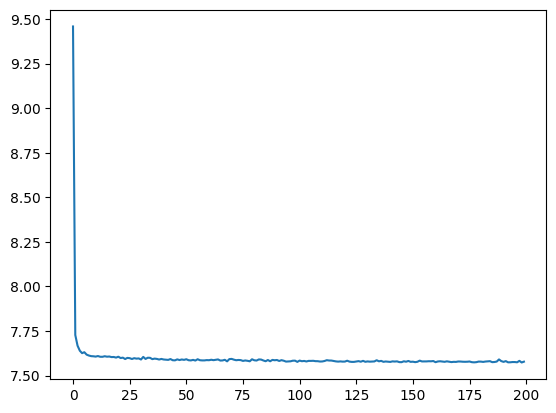

In [ ]:
# MSE at each epoch
plt.plot(br_train_loss)

In [ ]:
# model evaluation on the testing set
br.eval()
loss_list = []
br_pred = np.array([])

for x, y in tqdm(test_loader_0, desc="testing"):
    pred = br(x.to(device))
    br_pred = np.concatenate((br_pred, pred.squeeze().detach().numpy()))

    loss = loss_func(pred.squeeze(), y.to(device))
    loss_list.append(loss.item())

br_test_loss = sum(loss_list) / len(loss_list)

testing:   0%|          | 0/30 [00:00<?, ?it/s]

In [ ]:
br_test_loss

7.368887996673584

### SVR

In [13]:
from sklearn import svm

In [14]:
for k in ['linear','poly','rbf','sigmoid']:
  clf = svm.SVR(kernel=k)
  clf.fit(X0_train, y0_train)
  confidence = clf.score(X0_train, y0_train)
  print(k,confidence)

#poly = 0.14, slightly higher than random guess , here we use poly in further analysis

linear -0.08180187520368443
poly 0.13838586738887237
rbf 0.06580116273263314
sigmoid -120.86706530343213


In [18]:
# grid for C, kernel, gamma and learning rate
svr_param = {
    'C': [0.1,1,10,100,1000],
    #'kernel': ['poly','rbf','sigmoid'], since selected in the first
    'gamma': [1e-7,1e-4,1e-3,1e-2]
}

stratifiedCV = StratifiedKFold(n_splits = 3)

In [19]:
BestSVR = GridSearchCV(
    estimator = svm.SVR(kernel='poly'),
    param_grid = svr_param,
    cv = 3,
    scoring = 'neg_mean_squared_error',
    verbose = 1,
    n_jobs = -1
)

In [20]:
BestSVR.fit(X0_train, y0_train)

Fitting 3 folds for each of 20 candidates, totalling 60 fits


GridSearchCV(cv=3, estimator=SVR(kernel='poly'), n_jobs=-1,
             param_grid={'C': [0.1, 1, 10, 100, 1000],
                         'gamma': [1e-07, 0.0001, 0.001, 0.01]},
             scoring='neg_mean_squared_error', verbose=1)

In [21]:
print(BestSVR.best_score_)
print(BestSVR.best_params_)

-8.751570163665543
{'C': 1000, 'gamma': 0.001}


In [22]:
kfold = KFold(n_splits = 10, shuffle = True, random_state = seed)

In [26]:
baseSVR_mse = cross_val_score(
    estimator = svm.SVR(kernel='poly', **BestSVR.best_params_),
    X = X0_train,
    y = y0_train,
    scoring = 'neg_mean_squared_error',
    cv = kfold)

In [27]:
baseSVR_pred = BestSVR.predict(X0_test)
baseSVR_test_mse = mean_squared_error(baseSVR_pred, y0_test)

In [28]:
baseSVR_test_mse

8.47472755305537

### XGBoost regressor

In [8]:
# grid for n_estimators, max_depth and learning rate
xg_param = {
    'n_estimators': [200, 500, 1000],
    'max_depth': [2, 3, 4, 5],
    # 'model__learning_rate': np.arange(start = 0.1, stop = 0.25, step = 0.05)
    'learning_rate': [0.001, 0.01, 0.1]
}

stratifiedCV = StratifiedKFold(n_splits = 3)

In [9]:
BestXGBR = GridSearchCV(
    estimator = XGBRegressor(importance_type = 'gain'),
    param_grid = xg_param,
    cv = 3,
    scoring = 'neg_mean_squared_error',
    verbose = 1,
    n_jobs = -1
)

In [10]:
BestXGBR.fit(X0_train, y0_train)

Fitting 3 folds for each of 36 candidates, totalling 108 fits


GridSearchCV(cv=3,
             estimator=XGBRegressor(base_score=None, booster=None,
                                    callbacks=None, colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None, device=None,
                                    early_stopping_rounds=None,
                                    enable_categorical=False, eval_metric=None,
                                    feature_types=None, gamma=None,
                                    grow_policy=None, importance_type='gain',
                                    interaction_constraints=None,
                                    learning_rate=None...
                                    max_cat_to_onehot=None, max_delta_step=None,
                                    max_depth=None, max_leaves=None,
                                    min_child_weight=None, missing=nan,
                                    monotone_constraints=None,
                                    multi_strategy=None, n_estimators=None,
                                    n_jobs=None, num_parallel_tree=None,
                                    random_state=None, ...),
             n_jobs=-1,
             param_grid={'learning_rate': [0.001, 0.01, 0.1],
                         'max_depth': [2, 3, 4, 5],
                         'n_estimators': [200, 500, 1000]},
             scoring='neg_mean_squared_error', verbose=1)

In [11]:
print(BestXGBR.best_score_)
print(BestXGBR.best_params_)

-7.351967493693034
{'learning_rate': 0.1, 'max_depth': 2, 'n_estimators': 500}


In [ ]:
kfold = KFold(n_splits = 10, shuffle = True, random_state = seed)

In [ ]:
baseXGBR_mse = cross_val_score(
    estimator = XGBRegressor(importance_type = 'gain', **BestXGBR.best_params_),
    X = X0_train,
    y = y0_train,
    scoring = 'neg_mean_squared_error',
    cv = kfold)

In [ ]:
baseXGBR_pred = BestXGBR.predict(X0_test)
baseXGBR_test_mse = mean_squared_error(baseXGBR_pred, y0_test)

In [ ]:
baseXGBR_test_mse

6.897291

### RF regressor

In [ ]:
rf_param = {
    'n_estimators': np.arange(start = 30, stop = 100, step = 10),
    'max_depth': np.arange(start = 4, stop = 9, step = 1)
}

In [ ]:
BestRFR = GridSearchCV(
    estimator = RandomForestRegressor(),
    param_grid = rf_param,
    scoring = 'neg_mean_squared_error',
    cv = 3,
    verbose = 1,
    n_jobs = -1
)

In [ ]:
BestRFR.fit(X0_train, y0_train)

Fitting 3 folds for each of 35 candidates, totalling 105 fits


GridSearchCV(cv=3, estimator=RandomForestRegressor(), n_jobs=-1,
             param_grid={'max_depth': array([4, 5, 6, 7, 8]),
                         'n_estimators': array([30, 40, 50, 60, 70, 80, 90])},
             scoring='neg_mean_squared_error', verbose=1)

In [ ]:
print(BestRFR.best_score_)
print(BestRFR.best_params_)

-7.599833778560908
{'max_depth': 8, 'n_estimators': 80}


In [ ]:
baseRFR_mse = cross_val_score(
    estimator = RandomForestRegressor(**BestRFR.best_params_),
    X = X0_train,
    y = y0_train,
    scoring = 'neg_mean_squared_error',
    cv = kfold)

In [ ]:
baseRFR_pred = BestRFR.predict(X0_test)
baseRFR_test_mse = mean_squared_error(baseRFR_pred, y0_test)

## Baseline - categorical outcome

In [30]:
y1 = torch.tensor(data_2['loscat_icu'], dtype = torch.int64)

X1_train, X1_test, y1_train, y1_test = train_test_split(X0, y1, test_size = 0.2, random_state = seed)

train_data_1 = icuDataset(X1_train, y1_train)
test_data_1 = icuDataset(X1_test, y1_test)

train_loader_1 = DataLoader(train_data_1, batch_size = 128, shuffle = True)
test_loader_1 = DataLoader(test_data_1, batch_size = 128, shuffle = False)

### Neural network

In [ ]:
class BaseClassifier(nn.Module):
    def __init__(self):
        super(BaseClassifier, self).__init__()
        self.fc_bc1 = nn.Linear(65, 32)
        self.fc_bc2 = nn.Linear(32, 16)
        self.fc_nc3 = nn.Linear(16, 7)
        self.softmax = nn.Softmax(dim = 1)

    def forward(self, x):
        x = self.fc_bc1(x)
        x = self.fc_bc2(x)
        x = self.fc_nc3(x)
        x = self.softmax(x)
        return x

In [ ]:
bc = BaseClassifier().to(device)

# loss function
loss_func = nn.CrossEntropyLoss()

# optimizer
opt = optim.SGD(list(bc.parameters()), lr = learning_rate, momentum = 0.9, weight_decay = 5e-4)

In [ ]:
bc_train_loss = []
bc_train_acc = []

for epoch in range(1, num_epochs + 1):
    bc.train()
    loss_list = []
    acc_list = []

    # require validation to search for best epoch?

    for x, y in tqdm(train_loader_1, desc=f"training epoch #{epoch}"):
        opt.zero_grad()   # drop the direction of the gradient
        pred = bc(x.to(device))   # prediction
        loss = loss_func(pred, y.to(device))
        acc = accuracy_score(pred.argmax(dim = 1), y.to(device))

        loss.backward()     # calculate the gradient
        opt.step()      # update the best gradient
        loss_list.append(loss.item())
        acc_list.append(acc.item())

    epoch_loss = sum(loss_list) / len(loss_list)
    epoch_acc = sum(acc_list) / len(acc_list)
    bc_train_loss.append(epoch_loss)
    bc_train_acc.append(epoch_acc)

training epoch #1:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #2:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #3:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #4:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #5:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #6:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #7:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #8:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #9:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #10:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #11:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #12:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #13:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #14:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #15:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #16:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #17:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #18:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #19:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #20:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #21:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #22:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #23:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #24:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #25:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #26:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #27:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #28:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #29:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #30:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #31:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #32:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #33:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #34:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #35:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #36:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #37:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #38:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #39:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #40:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #41:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #42:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #43:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #44:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #45:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #46:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #47:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #48:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #49:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #50:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #51:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #52:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #53:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #54:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #55:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #56:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #57:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #58:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #59:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #60:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #61:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #62:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #63:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #64:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #65:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #66:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #67:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #68:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #69:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #70:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #71:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #72:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #73:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #74:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #75:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #76:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #77:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #78:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #79:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #80:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #81:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #82:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #83:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #84:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #85:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #86:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #87:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #88:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #89:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #90:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #91:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #92:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #93:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #94:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #95:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #96:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #97:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #98:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #99:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #100:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #101:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #102:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #103:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #104:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #105:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #106:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #107:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #108:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #109:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #110:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #111:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #112:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #113:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #114:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #115:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #116:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #117:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #118:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #119:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #120:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #121:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #122:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #123:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #124:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #125:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #126:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #127:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #128:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #129:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #130:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #131:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #132:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #133:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #134:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #135:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #136:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #137:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #138:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #139:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #140:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #141:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #142:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #143:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #144:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #145:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #146:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #147:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #148:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #149:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #150:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #151:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #152:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #153:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #154:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #155:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #156:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #157:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #158:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #159:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #160:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #161:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #162:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #163:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #164:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #165:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #166:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #167:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #168:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #169:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #170:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #171:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #172:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #173:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #174:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #175:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #176:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #177:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #178:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #179:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #180:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #181:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #182:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #183:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #184:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #185:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #186:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #187:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #188:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #189:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #190:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #191:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #192:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #193:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #194:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #195:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #196:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #197:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #198:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #199:   0%|          | 0/120 [00:00<?, ?it/s]

training epoch #200:   0%|          | 0/120 [00:00<?, ?it/s]

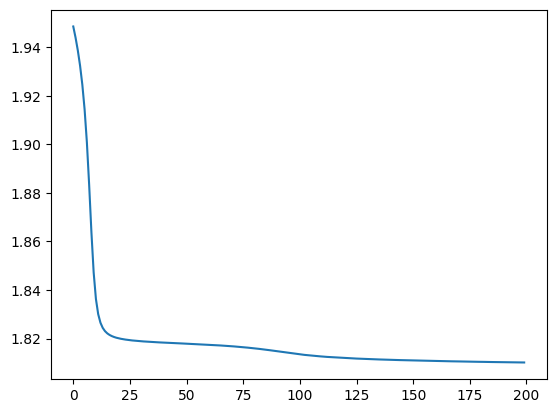

In [ ]:
plt.plot(bc_train_loss)

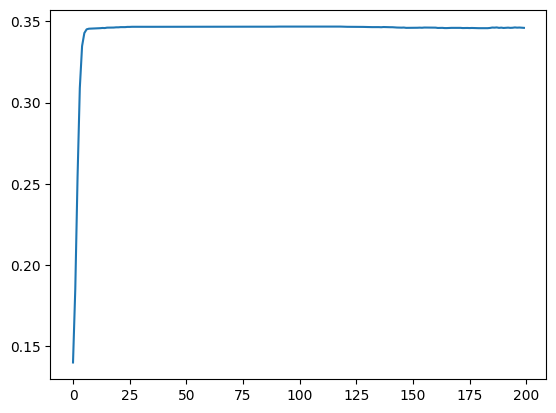

In [ ]:
plt.plot(bc_train_acc)

In [ ]:
# model evaluation on the testing set
bc.eval()
loss_list = []
acc_list = []
bc_pred = np.array([])

for x, y in tqdm(test_loader_1, desc="testing"):
    pred = bc(x.to(device))
    # print(pred.argmax(dim = 1).detach().numpy().shape)
    bc_pred = np.concatenate((bc_pred, pred.argmax(dim = 1).detach().numpy()))

    loss = loss_func(pred.squeeze(), y.to(device))
    acc = accuracy_score(pred.argmax(dim = 1), y.to(device))
    loss_list.append(loss.item())
    acc_list.append(acc.item())

bc_test_loss = sum(loss_list) / len(loss_list)
bc_test_acc = sum(acc_list) / len(acc_list)

testing:   0%|          | 0/30 [00:00<?, ?it/s]

In [ ]:
bc_test_loss

1.8146159807840982

In [ ]:
bc_test_acc

0.34427083333333336

### SVM

In [31]:
for k in ['linear','poly','rbf','sigmoid']:
  clf = svm.SVC(kernel=k)
  clf.fit(X1_train, y1_train)
  confidence = clf.score(X1_train, y1_train)
  print(k,confidence)

#poly = 0.48 best, here we use poly in further analysis

linear 0.3466371508561755
poly 0.4866202226707468
rbf 0.3966404062764503
sigmoid 0.2658376196366951


In [33]:
# grid for C, kernel, gamma and learning rate
svm_param = {
    'C': [0.1,1,10,100,1000],
    #'kernel': ['poly','rbf','sigmoid'], since selected in the first
    #'gamma': [1e-7,1e-4,1e-3,1e-2]
}

stratifiedCV = StratifiedKFold(n_splits = 3)

In [34]:
BestSVM = GridSearchCV(
    estimator = svm.SVC(kernel='poly'),
    param_grid = svm_param,
    cv = 3,
    scoring = 'accuracy',
    verbose = 1,
    n_jobs = -1
)

In [35]:
BestSVM.fit(X1_train, y1_train)

Fitting 3 folds for each of 5 candidates, totalling 15 fits


GridSearchCV(cv=3, estimator=SVC(kernel='poly'), n_jobs=-1,
             param_grid={'C': [0.1, 1, 10, 100, 1000]}, scoring='accuracy',
             verbose=1)

In [36]:
print(BestSVM.best_score_)
print(BestSVM.best_params_)

0.34520473918652733
{'C': 0.1}


In [83]:
baseSVM_acc = cross_val_score(
    estimator = svm.SVC(kernel='poly', **BestSVM.best_params_),
    X = X1_train,
    y = y1_train,
    scoring = 'accuracy',
    cv = kfold)

In [84]:
baseSVM_pred = BestSVM.predict(X1_test)
baseSVM_test_acc = accuracy_score(baseSVM_pred, y1_test)

In [85]:
baseSVM_test_acc

0.3455729166666667

### XGBoost classifier

In [41]:
BestXGBC = GridSearchCV(
    estimator = XGBClassifier(importance_type = 'gain'),
    param_grid = xg_param,
    scoring = 'accuracy',
    cv = stratifiedCV,
    verbose = 1,
    n_jobs = -1
)

In [42]:
BestXGBC.fit(X1_train, y1_train)

Fitting 3 folds for each of 36 candidates, totalling 108 fits


GridSearchCV(cv=StratifiedKFold(n_splits=3, random_state=None, shuffle=False),
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     grow_policy=None, importance_...
                                     max_cat_to_onehot=None,
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=None,
                                     n_jobs=None, num_parallel_tree=None,
                                     random_state=None, ...),
             n_jobs=-1,
             param_grid={'learning_rate': [0.001, 0.01, 0.1],
                         'max_depth': [2, 3, 4, 5],
                         'n_estimators': [200, 500, 1000]},
             scoring='accuracy', verbose=1)

In [43]:
print(BestXGBC.best_score_)
print(BestXGBC.best_params_)

0.3465720665860845
{'learning_rate': 0.01, 'max_depth': 2, 'n_estimators': 1000}


In [ ]:
baseXGBC_acc = cross_val_score(
    estimator = XGBClassifier(importance_type = 'gain', **BestXGBC.best_params_),
    X = X1_train,
    y = y1_train,
    scoring = 'accuracy',
    cv = kfold)

In [ ]:
baseXGBC_pred = BestXGBC.predict(X1_test)
baseXGBC_test_acc = accuracy_score(baseXGBC_pred, y1_test)

In [46]:
baseXGBC_test_acc

0.34348958333333335

### RF classifier

In [ ]:
BestRFC = GridSearchCV(
    estimator = RandomForestClassifier(criterion = 'entropy', class_weight = 'balanced'),
    param_grid = rf_param,
    scoring = 'accuracy',
    cv = stratifiedCV,
    verbose = 1,
    n_jobs = -1
)

In [ ]:
BestRFC.fit(X1_train, y1_train)

Fitting 3 folds for each of 35 candidates, totalling 105 fits


GridSearchCV(cv=StratifiedKFold(n_splits=3, random_state=None, shuffle=False),
             estimator=RandomForestClassifier(class_weight='balanced',
                                              criterion='entropy'),
             n_jobs=-1,
             param_grid={'max_depth': array([4, 5, 6, 7, 8]),
                         'n_estimators': array([30, 40, 50, 60, 70, 80, 90])},
             scoring='accuracy', verbose=1)

In [ ]:
print(BestRFC.best_score_)
print(BestRFC.best_params_)

0.24155240688285473
{'max_depth': 8, 'n_estimators': 90}


In [ ]:
baseRFC_acc = cross_val_score(
    estimator = RandomForestClassifier(criterion = 'entropy', class_weight = 'balanced', **BestRFC.best_params_),
    X = X1_train,
    y = y1_train,
    scoring = 'accuracy',
    cv = kfold
)

In [ ]:
baseRFC_pred = BestRFC.predict(X1_test)
baseRFC_test_acc = accuracy_score(baseRFC_pred, y1_test)

## Encoder (binary classification) + Continuous duration

### Encoder

In [47]:
y2 = torch.tensor(data_1['icu_death'], dtype = torch.float32)
X2 = torch.tensor(data_1.iloc[:, 1:].values, dtype = torch.float32)

X2_train, X2_test, y2_train, y2_test = train_test_split(X2, y2, test_size = 0.2, random_state = seed)

train_data_2 = icuDataset(X2_train, y2_train)
test_data_2 = icuDataset(X2_test, y2_test)

train_loader_2 = DataLoader(train_data_2, batch_size = 128, shuffle = True)
test_loader_2 = DataLoader(test_data_2, batch_size = 128, shuffle = False)

In [48]:
# encoder with two layers for binary classification
class Encoder(nn.Module):
    def __init__(self):
        super(Encoder, self).__init__()
        self.fc1 = nn.Linear(65, 128)
        self.fc2 = nn.Linear(128, 64)

    def forward(self, x):
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        return x

In [49]:
# binary classifier with single layer
class Classifier(nn.Module):
    def __init__(self):
        super(Classifier, self).__init__()
        self.fc3 = nn.Linear(64, 1)

    def forward(self, x):
        x = torch.sigmoid(self.fc3(x))
        return x

In [50]:
loss_func = nn.MSELoss()

encoder = Encoder().to(device)
clf = Classifier().to(device)

opt = optim.SGD(list(encoder.parameters()) + list(clf.parameters()),
                lr = learning_rate, momentum = 0.9, weight_decay = 5e-4)

In [51]:
train_loss = []
train_acc = []

for epoch in range(1, num_epochs + 1):
    encoder.train()
    clf.train()
    loss_list = []
    acc_list = []

    # require validation to search for best epoch?

    for x, y in tqdm(train_loader_2, desc=f"training epoch #{epoch}"):
        opt.zero_grad()   # drop the direction of the gradient
        embedding = encoder(x.to(device))
        pred = clf(embedding)   # prediction
        loss = loss_func(pred.squeeze(), y.to(device))
        acc = cal_accuracy(pred.squeeze(), y.to(device))

        loss.backward()     # calculate the gradient
        opt.step()      # update the best gradient
        loss_list.append(loss.item())
        acc_list.append(acc.item())

    epoch_loss = sum(loss_list) / len(loss_list)
    epoch_acc = sum(acc_list) / len(acc_list)
    train_loss.append(epoch_loss)
    train_acc.append(epoch_acc)

# save_checkpoints(encoder, decoder, opt, os.path.join(log_dir, 'ckpt.pth'))      # save the keys of final optimal model


training epoch #1:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #2:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #3:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #4:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #5:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #6:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #7:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #8:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #9:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #10:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #11:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #12:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #13:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #14:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #15:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #16:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #17:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #18:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #19:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #20:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #21:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #22:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #23:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #24:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #25:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #26:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #27:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #28:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #29:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #30:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #31:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #32:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #33:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #34:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #35:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #36:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #37:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #38:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #39:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #40:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #41:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #42:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #43:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #44:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #45:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #46:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #47:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #48:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #49:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #50:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #51:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #52:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #53:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #54:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #55:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #56:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #57:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #58:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #59:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #60:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #61:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #62:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #63:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #64:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #65:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #66:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #67:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #68:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #69:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #70:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #71:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #72:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #73:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #74:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #75:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #76:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #77:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #78:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #79:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #80:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #81:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #82:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #83:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #84:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #85:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #86:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #87:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #88:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #89:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #90:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #91:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #92:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #93:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #94:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #95:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #96:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #97:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #98:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #99:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #100:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #101:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #102:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #103:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #104:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #105:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #106:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #107:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #108:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #109:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #110:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #111:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #112:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #113:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #114:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #115:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #116:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #117:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #118:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #119:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #120:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #121:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #122:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #123:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #124:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #125:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #126:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #127:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #128:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #129:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #130:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #131:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #132:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #133:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #134:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #135:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #136:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #137:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #138:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #139:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #140:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #141:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #142:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #143:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #144:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #145:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #146:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #147:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #148:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #149:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #150:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #151:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #152:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #153:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #154:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #155:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #156:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #157:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #158:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #159:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #160:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #161:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #162:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #163:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #164:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #165:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #166:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #167:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #168:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #169:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #170:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #171:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #172:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #173:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #174:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #175:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #176:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #177:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #178:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #179:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #180:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #181:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #182:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #183:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #184:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #185:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #186:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #187:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #188:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #189:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #190:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #191:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #192:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #193:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #194:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #195:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #196:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #197:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #198:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #199:   0%|          | 0/216 [00:00<?, ?it/s]

training epoch #200:   0%|          | 0/216 [00:00<?, ?it/s]

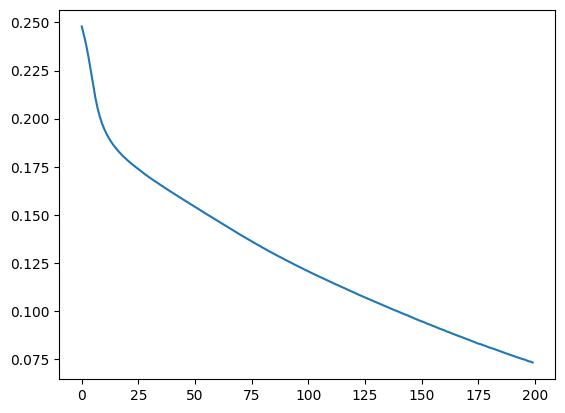

In [52]:
plt.plot(train_loss)

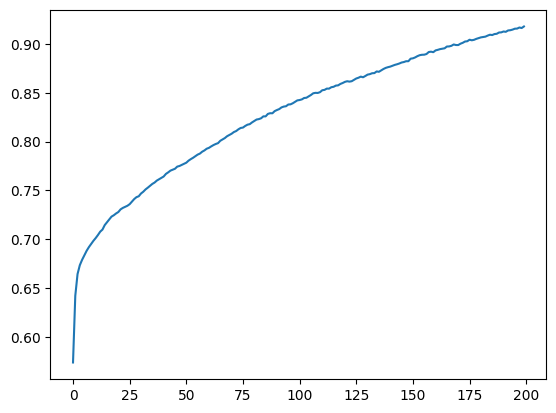

In [53]:
plt.plot(train_acc)

In [54]:
encoder.eval()
clf.eval()
loss_list = []
acc_list = []

for x, y in tqdm(test_loader_2, desc="testing"):
    embedding = encoder(x.to(device))
    pred = clf(embedding)
    loss = loss_func(pred.squeeze(), y.to(device))
    acc = cal_accuracy(pred.squeeze(), y.to(device))

    loss_list.append(loss.item())
    acc_list.append(acc.item())

test_loss = sum(loss_list) / len(loss_list)
test_acc = sum(acc_list) / len(acc_list)

testing:   0%|          | 0/54 [00:00<?, ?it/s]

In [55]:
test_loss

0.09324811674930432

In [56]:
test_acc

0.8808199719146446

In [ ]:
# generate embeddings
# x = torch.tensor(data.iloc[:, 2:].values, dtype=torch.float32)      # data = df2
# embedding = encoder(x.to(device))

In [ ]:
# embedding.shape

In [ ]:
# save trained embedding
# np.save('./embedding.npy', embedding.detach().numpy())

In [ ]:
# load_checkpoints(encoder, clf, opt, os.path.join(log_dir, 'ckpt.pth'))

In [57]:
embedding = encoder(X0.to(device)).detach()
icudeath_pred = torch.round(clf(embedding).squeeze())

In [58]:
y_death = y0[icudeath_pred == 1]
embedding_death = embedding[icudeath_pred == 1]
y_discharge = y0[icudeath_pred == 0]
embedding_discharge = embedding[icudeath_pred == 0]

### group: death

In [59]:
X_train, X_test, y_train, y_condeath_test = train_test_split(embedding_death, y_death, test_size = 0.2, random_state = seed)

train_death = icuDataset(X_train, y_train)
test_death = icuDataset(X_test, y_condeath_test)

train_loader_death = DataLoader(train_death, batch_size = 32, shuffle = True)
test_loader_death = DataLoader(test_death, batch_size = 32, shuffle = False)

#### Neural network

In [ ]:
# regressor for icu duration as a continuous outcome
class Regressor(nn.Module):
    def __init__(self):
        super(Regressor, self).__init__()
        self.fc_r1 = nn.Linear(64, 32)
        self.fc_r2 = nn.Linear(32, 1)

    def forward(self, x):
        x = self.fc_r1(x)
        x = F.relu(self.fc_r2(x))
        return x

In [ ]:
loss_func = torch.nn.MSELoss()

reg_death = Regressor().to(device)

opt = optim.SGD(list(reg_death.parameters()), lr = learning_rate,
                momentum = 0.9, weight_decay = 5e-4)

In [ ]:
condeath_train_loss = []

for epoch in range(1, num_epochs + 1):
    reg_death.train()
    loss_list = []

    for x, y in tqdm(train_loader_death, desc = f"training epoch #{epoch}"):
        opt.zero_grad()
        pred = reg_death(x.to(device))   # prediction
        loss = loss_func(pred.squeeze(), y.to(device))

        loss.backward()
        opt.step()      # update the best gradient
        loss_list.append(loss.item())

    epoch_loss = sum(loss_list) / len(loss_list)
    condeath_train_loss.append(epoch_loss)

training epoch #1:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #2:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #3:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #4:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #5:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #6:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #7:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #8:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #9:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #10:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #11:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #12:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #13:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #14:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #15:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #16:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #17:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #18:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #19:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #20:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #21:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #22:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #23:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #24:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #25:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #26:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #27:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #28:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #29:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #30:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #31:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #32:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #33:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #34:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #35:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #36:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #37:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #38:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #39:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #40:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #41:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #42:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #43:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #44:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #45:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #46:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #47:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #48:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #49:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #50:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #51:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #52:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #53:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #54:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #55:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #56:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #57:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #58:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #59:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #60:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #61:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #62:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #63:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #64:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #65:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #66:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #67:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #68:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #69:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #70:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #71:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #72:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #73:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #74:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #75:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #76:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #77:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #78:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #79:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #80:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #81:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #82:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #83:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #84:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #85:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #86:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #87:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #88:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #89:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #90:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #91:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #92:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #93:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #94:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #95:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #96:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #97:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #98:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #99:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #100:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #101:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #102:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #103:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #104:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #105:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #106:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #107:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #108:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #109:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #110:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #111:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #112:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #113:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #114:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #115:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #116:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #117:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #118:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #119:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #120:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #121:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #122:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #123:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #124:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #125:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #126:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #127:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #128:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #129:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #130:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #131:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #132:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #133:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #134:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #135:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #136:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #137:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #138:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #139:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #140:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #141:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #142:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #143:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #144:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #145:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #146:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #147:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #148:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #149:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #150:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #151:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #152:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #153:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #154:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #155:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #156:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #157:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #158:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #159:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #160:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #161:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #162:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #163:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #164:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #165:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #166:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #167:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #168:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #169:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #170:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #171:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #172:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #173:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #174:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #175:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #176:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #177:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #178:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #179:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #180:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #181:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #182:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #183:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #184:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #185:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #186:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #187:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #188:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #189:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #190:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #191:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #192:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #193:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #194:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #195:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #196:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #197:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #198:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #199:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #200:   0%|          | 0/87 [00:00<?, ?it/s]

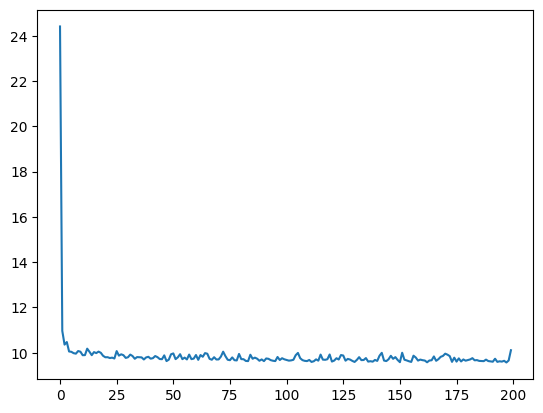

In [ ]:
plt.plot(condeath_train_loss)

In [ ]:
reg_death.eval()
loss_list = []
condeath_pred = np.array([])

for x, y in tqdm(test_loader_death, desc="testing"):
    pred = reg_death(x.to(device))
    condeath_pred = np.concatenate((condeath_pred, pred.squeeze().detach().numpy()))

    loss = loss_func(pred.squeeze(), y.to(device))
    loss_list.append(loss.item())

condeath_test_loss = sum(loss_list) / len(loss_list)

testing:   0%|          | 0/22 [00:00<?, ?it/s]

In [ ]:
condeath_test_loss

10.417430769313466

#### SVR

In [60]:
for k in ['linear','poly','rbf','sigmoid']:
  clf = svm.SVR(kernel=k)
  clf.fit(X_train, y_train)
  confidence = clf.score(X_train, y_train)
  print(k,confidence)

#actually all not good, choose poly is the best which is the closest to 0

linear -0.0889502700898166
poly -0.0141345054315547
rbf -0.05648318880939973
sigmoid -166.1588338718101


In [69]:
BestSVR = GridSearchCV(
    estimator = svm.SVR(kernel='poly'),
    param_grid = svr_param,
    cv = 3,
    scoring = 'neg_mean_squared_error',
    verbose = 1,
    n_jobs = -1
)

In [70]:
BestSVR.fit(X_train, y_train)

Fitting 3 folds for each of 20 candidates, totalling 60 fits


GridSearchCV(cv=3, estimator=SVR(kernel='poly'), n_jobs=-1,
             param_grid={'C': [0.1, 1, 10, 100, 1000],
                         'gamma': [1e-07, 0.0001, 0.001, 0.01]},
             scoring='neg_mean_squared_error', verbose=1)

In [71]:
print(BestSVR.best_score_)
print(BestSVR.best_params_)

-11.426151372492754
{'C': 100, 'gamma': 0.01}


In [72]:
baseSVR_mse = cross_val_score(
    estimator = svm.SVR(kernel='poly', **BestSVR.best_params_),
    X = X_train,
    y = y_train,
    scoring = 'neg_mean_squared_error',
    cv = kfold)

In [73]:
condeathSVR_pred = BestSVR.predict(X_test)
condeathSVR_test_mse = mean_squared_error(condeathSVR_pred, y_condeath_test)

In [74]:
condeathSVR_test_mse

11.87702431891563

#### XGBoost regressor

In [ ]:
BestXGBR = GridSearchCV(
    estimator = XGBRegressor(importance_type = 'gain'),
    param_grid = xg_param,
    cv = 3,
    scoring = 'neg_mean_squared_error',
    verbose = 1,
    n_jobs = -1
)

In [ ]:
BestXGBR.fit(X_train, y_train)

Fitting 3 folds for each of 36 candidates, totalling 108 fits


GridSearchCV(cv=3,
             estimator=XGBRegressor(base_score=None, booster=None,
                                    callbacks=None, colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None, device=None,
                                    early_stopping_rounds=None,
                                    enable_categorical=False, eval_metric=None,
                                    feature_types=None, gamma=None,
                                    grow_policy=None, importance_type='gain',
                                    interaction_constraints=None,
                                    learning_rate=None...
                                    max_cat_to_onehot=None, max_delta_step=None,
                                    max_depth=None, max_leaves=None,
                                    min_child_weight=None, missing=nan,
                                    monotone_constraints=None,
                                    multi_strategy=None, n_estimators=None,
                                    n_jobs=None, num_parallel_tree=None,
                                    random_state=None, ...),
             n_jobs=-1,
             param_grid={'learning_rate': [0.001, 0.01, 0.1],
                         'max_depth': [2, 3, 4, 5],
                         'n_estimators': [200, 500, 1000]},
             scoring='neg_mean_squared_error', verbose=1)

In [ ]:
print(BestXGBR.best_score_)
print(BestXGBR.best_params_)

-9.963223457336426
{'learning_rate': 0.001, 'max_depth': 2, 'n_estimators': 1000}


In [ ]:
condeathXGBR_mse = cross_val_score(
    estimator = XGBRegressor(importance_type = 'gain', **BestXGBR.best_params_),
    X = X_train,
    y = y_train,
    scoring = 'neg_mean_squared_error',
    cv = kfold)

In [ ]:
condeathXGBR_pred = BestXGBR.predict(X_test)
condeathXGBR_test_mse = mean_squared_error(condeathXGBR_pred, y_condeath_test)

#### RF regressor

In [ ]:
BestRFR = GridSearchCV(
    estimator = RandomForestRegressor(),
    param_grid = rf_param,
    scoring = 'neg_mean_squared_error',
    cv = 3,
    verbose = 1,
    n_jobs = -1
)

In [ ]:
BestRFR.fit(X_train, y_train)

Fitting 3 folds for each of 35 candidates, totalling 105 fits


GridSearchCV(cv=3, estimator=RandomForestRegressor(), n_jobs=-1,
             param_grid={'max_depth': array([4, 5, 6, 7, 8]),
                         'n_estimators': array([30, 40, 50, 60, 70, 80, 90])},
             scoring='neg_mean_squared_error', verbose=1)

In [ ]:
print(BestRFR.best_score_)
print(BestRFR.best_params_)

-9.974927261754758
{'max_depth': 4, 'n_estimators': 50}


In [ ]:
condeathRFR_mse = cross_val_score(
    estimator = RandomForestRegressor(**BestRFR.best_params_),
    X = X_train,
    y = y_train,
    scoring = 'neg_mean_squared_error',
    cv = kfold)

In [ ]:
condeathRFR_pred = BestRFR.predict(X_test)
condeathRFR_test_mse = mean_squared_error(condeathRFR_pred, y_condeath_test)

### group: discharge

In [75]:
X_train, X_test, y_train, y_condischarge_test = train_test_split(embedding_discharge, y_discharge, test_size = 0.2, random_state = seed)

train_discharge = icuDataset(X_train, y_train)
test_discharge = icuDataset(X_test, y_condischarge_test)

train_loader_discharge = DataLoader(train_discharge, batch_size = 64, shuffle = True)
test_loader_discharge = DataLoader(test_discharge, batch_size = 64, shuffle = False)

#### Neural network

In [ ]:
loss_func = nn.MSELoss()

reg_discharge = Regressor().to(device)

opt = optim.SGD(list(reg_discharge.parameters()), lr=learning_rate,
                momentum = 0.9, weight_decay = 5e-4)

In [ ]:
condischarge_train_loss = []

for epoch in range(1, num_epochs + 1):
    reg_discharge.train()
    loss_list = []

    for x, y in tqdm(train_loader_discharge, desc=f"training epoch #{epoch}"):
        opt.zero_grad()   # drop the direction of the gradient
        pred = reg_discharge(x.to(device))   # prediction
        loss = loss_func(pred.squeeze(), y.to(device))

        loss.backward()     # calculate the gradient
        opt.step()      # update the best gradient
        loss_list.append(loss.item())

    epoch_loss = sum(loss_list) / len(loss_list)
    condischarge_train_loss.append(epoch_loss)

training epoch #1:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #2:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #3:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #4:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #5:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #6:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #7:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #8:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #9:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #10:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #11:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #12:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #13:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #14:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #15:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #16:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #17:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #18:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #19:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #20:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #21:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #22:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #23:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #24:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #25:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #26:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #27:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #28:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #29:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #30:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #31:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #32:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #33:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #34:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #35:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #36:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #37:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #38:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #39:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #40:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #41:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #42:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #43:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #44:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #45:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #46:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #47:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #48:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #49:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #50:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #51:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #52:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #53:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #54:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #55:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #56:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #57:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #58:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #59:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #60:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #61:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #62:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #63:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #64:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #65:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #66:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #67:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #68:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #69:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #70:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #71:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #72:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #73:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #74:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #75:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #76:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #77:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #78:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #79:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #80:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #81:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #82:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #83:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #84:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #85:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #86:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #87:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #88:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #89:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #90:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #91:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #92:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #93:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #94:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #95:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #96:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #97:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #98:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #99:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #100:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #101:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #102:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #103:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #104:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #105:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #106:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #107:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #108:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #109:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #110:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #111:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #112:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #113:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #114:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #115:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #116:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #117:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #118:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #119:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #120:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #121:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #122:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #123:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #124:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #125:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #126:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #127:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #128:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #129:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #130:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #131:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #132:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #133:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #134:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #135:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #136:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #137:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #138:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #139:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #140:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #141:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #142:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #143:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #144:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #145:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #146:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #147:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #148:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #149:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #150:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #151:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #152:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #153:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #154:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #155:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #156:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #157:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #158:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #159:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #160:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #161:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #162:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #163:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #164:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #165:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #166:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #167:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #168:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #169:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #170:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #171:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #172:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #173:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #174:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #175:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #176:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #177:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #178:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #179:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #180:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #181:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #182:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #183:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #184:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #185:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #186:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #187:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #188:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #189:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #190:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #191:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #192:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #193:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #194:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #195:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #196:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #197:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #198:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #199:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #200:   0%|          | 0/197 [00:00<?, ?it/s]

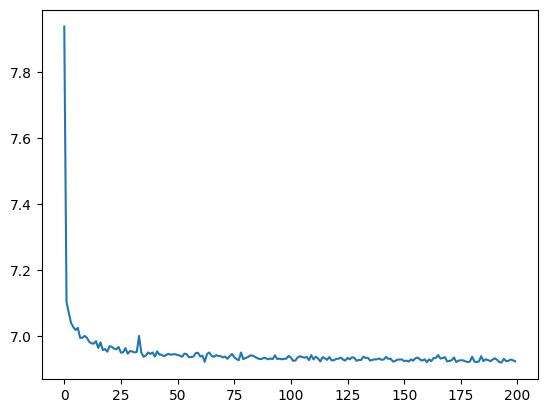

In [ ]:
plt.plot(condischarge_train_loss)

In [ ]:
reg_discharge.eval()
loss_list = []
condischarge_pred = np.array([])

for x, y in tqdm(test_loader_discharge, desc="testing"):
    pred = reg_discharge(x.to(device))
    condischarge_pred = np.concatenate((condischarge_pred, pred.squeeze().detach().numpy()))

    loss = loss_func(pred.squeeze(), y.to(device))
    loss_list.append(loss.item())

condischarge_test_loss = sum(loss_list) / len(loss_list)

testing:   0%|          | 0/50 [00:00<?, ?it/s]

In [ ]:
condischarge_test_loss

7.018274865150452

#### SVR

In [76]:
BestSVR.fit(X_train, y_train)

Fitting 3 folds for each of 20 candidates, totalling 60 fits


/usr/local/lib/python3.10/dist-packages/joblib/externals/loky/backend/fork_exec.py:38: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid = os.fork()


GridSearchCV(cv=3, estimator=SVR(kernel='poly'), n_jobs=-1,
             param_grid={'C': [0.1, 1, 10, 100, 1000],
                         'gamma': [1e-07, 0.0001, 0.001, 0.01]},
             scoring='neg_mean_squared_error', verbose=1)

In [77]:
print(BestSVR.best_score_)
print(BestSVR.best_params_)

-7.9326318722864215
{'C': 1000, 'gamma': 0.01}


In [79]:
condischargeSVR_mse = cross_val_score(
    estimator = svm.SVR(kernel='poly', **BestSVR.best_params_),
    X = X_train,
    y = y_train,
    scoring = 'neg_mean_squared_error',
    cv = kfold)

In [80]:
condischargeSVR_pred = BestSVR.predict(X_test)
condischargeSVR_test_mse = mean_squared_error(condischargeSVR_pred, y_condischarge_test)

In [81]:
condischargeSVR_test_mse

7.923017765661191

#### XGBoost regressor

In [ ]:
BestXGBR = GridSearchCV(
    estimator = XGBRegressor(importance_type = 'gain'),
    param_grid = xg_param,
    cv = 3,
    scoring = 'neg_mean_squared_error',
    verbose = 1,
    n_jobs = -1
)

In [ ]:
BestXGBR.fit(X_train, y_train)

Fitting 3 folds for each of 36 candidates, totalling 108 fits


GridSearchCV(cv=3,
             estimator=XGBRegressor(base_score=None, booster=None,
                                    callbacks=None, colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None, device=None,
                                    early_stopping_rounds=None,
                                    enable_categorical=False, eval_metric=None,
                                    feature_types=None, gamma=None,
                                    grow_policy=None, importance_type='gain',
                                    interaction_constraints=None,
                                    learning_rate=None...
                                    max_cat_to_onehot=None, max_delta_step=None,
                                    max_depth=None, max_leaves=None,
                                    min_child_weight=None, missing=nan,
                                    monotone_constraints=None,
                                    multi_strategy=None, n_estimators=None,
                                    n_jobs=None, num_parallel_tree=None,
                                    random_state=None, ...),
             n_jobs=-1,
             param_grid={'learning_rate': [0.001, 0.01, 0.1],
                         'max_depth': [2, 3, 4, 5],
                         'n_estimators': [200, 500, 1000]},
             scoring='neg_mean_squared_error', verbose=1)

In [ ]:
print(BestXGBR.best_score_)
print(BestXGBR.best_params_)

-7.013344446818034
{'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 500}


In [ ]:
condischargeXGBR_mse = cross_val_score(
    estimator = XGBRegressor(importance_type = 'gain', **BestXGBR.best_params_),
    X = X_train,
    y = y_train,
    scoring = 'neg_mean_squared_error',
    cv = kfold)

In [ ]:
condischargeXGBR_pred = BestXGBR.predict(X_test)
condischargeXGBR_test_mse = mean_squared_error(condischargeXGBR_pred, y_condischarge_test)

#### RF regressor

In [ ]:
BestRFR = GridSearchCV(
    estimator = RandomForestRegressor(),
    param_grid = rf_param,
    scoring = 'neg_mean_squared_error',
    cv = 3,
    verbose = 1,
    n_jobs = -1
)

In [ ]:
BestRFR.fit(X_train, y_train)

Fitting 3 folds for each of 35 candidates, totalling 105 fits


GridSearchCV(cv=3, estimator=RandomForestRegressor(), n_jobs=-1,
             param_grid={'max_depth': array([4, 5, 6, 7, 8]),
                         'n_estimators': array([30, 40, 50, 60, 70, 80, 90])},
             scoring='neg_mean_squared_error', verbose=1)

In [ ]:
print(BestRFR.best_score_)
print(BestRFR.best_params_)

-7.004759329504462
{'max_depth': 7, 'n_estimators': 90}


In [ ]:
condischargeRFR_mse = cross_val_score(
    estimator = RandomForestRegressor(**BestRFR.best_params_),
    X = X_train,
    y = y_train,
    scoring = 'neg_mean_squared_error',
    cv = kfold)

In [ ]:
condischargeRFR_pred = BestRFR.predict(X_test)
condischargeRFR_test_mse = mean_squared_error(condischargeRFR_pred, y_condischarge_test)

## Encoder + Categorical outcome

In [86]:
y_death = y1[icudeath_pred == 1]
y_discharge = y1[icudeath_pred == 0]

In [87]:
freq = np.unique(y_death.detach().numpy(), return_counts = True)
weight_death = freq[1]/sum(freq[1])
freq

(array([0, 1, 2, 3, 4, 5, 6]),
 array([1021,  648,  454,  333,  225,  190,  685]))

In [88]:
freq = np.unique(y_discharge, return_counts = True)
weight_discharge = freq[1]/sum(freq[1])
freq

(array([0, 1, 2, 3, 4, 5, 6]),
 array([5622, 3482, 2072, 1270,  868,  573, 1756]))

In [89]:
# classifier for icu duration as a categorical outcome with 7 levels
class nClassifier(nn.Module):
    def __init__(self):
        super(nClassifier, self).__init__()
        self.fc_nc1 = nn.Linear(64, 32)
        self.fc_nc2 = nn.Linear(32, 16)
        self.fc_nc3 = nn.Linear(16, 7)
        self.softmax = nn.Softmax(dim = 1)

    def forward(self, x):
        x = self.fc_nc1(x)
        x = self.fc_nc2(x)
        x = self.fc_nc3(x)
        x = self.softmax(x)
        return x

### group: death

In [90]:
X_train, X_test, y_train, y_catdeath_test = train_test_split(embedding_death, y_death, test_size = 0.2, random_state = seed)

train_death = icuDataset(X_train, y_train)
test_death = icuDataset(X_test, y_catdeath_test)

train_loader_death = DataLoader(train_death, batch_size=32, shuffle=True)
test_loader_death = DataLoader(test_death, batch_size=32, shuffle=False)

#### Neural network

In [ ]:
loss_func = nn.CrossEntropyLoss(weight = torch.tensor(weight_death, dtype = torch.float32).to(device))

nclf_death = nClassifier().to(device)

opt = optim.SGD(list(nclf_death.parameters()), lr=learning_rate,
                momentum = 0.9, weight_decay = 5e-4)

In [ ]:
catdeath_train_loss = []
catdeath_train_acc = []

for epoch in range(1, 1+num_epochs):
    nclf_death.train()
    loss_list = []
    acc_list = []

    for x, y in tqdm(train_loader_death, desc=f"training epoch #{epoch}"):
        opt.zero_grad()   # drop the direction of the gradient
        pred = nclf_death(x.to(device))  # prediction
        loss = loss_func(pred, y.to(device))
        acc = accuracy_score(pred.argmax(dim = 1), y.to(device))

        loss.backward()     # calculate the gradient
        opt.step()      # update the best gradient
        loss_list.append(loss.item())
        acc_list.append(acc.item())

    epoch_loss = sum(loss_list) / len(loss_list)
    epoch_acc = sum(acc_list) / len(acc_list)
    catdeath_train_loss.append(epoch_loss)
    catdeath_train_acc.append(epoch_acc)

training epoch #1:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #2:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #3:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #4:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #5:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #6:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #7:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #8:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #9:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #10:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #11:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #12:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #13:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #14:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #15:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #16:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #17:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #18:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #19:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #20:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #21:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #22:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #23:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #24:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #25:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #26:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #27:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #28:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #29:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #30:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #31:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #32:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #33:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #34:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #35:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #36:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #37:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #38:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #39:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #40:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #41:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #42:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #43:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #44:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #45:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #46:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #47:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #48:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #49:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #50:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #51:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #52:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #53:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #54:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #55:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #56:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #57:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #58:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #59:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #60:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #61:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #62:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #63:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #64:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #65:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #66:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #67:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #68:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #69:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #70:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #71:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #72:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #73:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #74:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #75:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #76:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #77:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #78:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #79:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #80:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #81:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #82:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #83:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #84:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #85:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #86:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #87:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #88:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #89:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #90:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #91:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #92:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #93:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #94:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #95:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #96:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #97:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #98:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #99:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #100:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #101:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #102:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #103:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #104:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #105:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #106:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #107:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #108:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #109:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #110:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #111:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #112:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #113:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #114:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #115:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #116:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #117:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #118:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #119:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #120:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #121:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #122:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #123:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #124:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #125:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #126:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #127:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #128:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #129:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #130:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #131:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #132:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #133:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #134:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #135:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #136:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #137:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #138:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #139:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #140:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #141:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #142:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #143:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #144:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #145:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #146:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #147:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #148:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #149:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #150:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #151:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #152:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #153:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #154:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #155:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #156:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #157:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #158:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #159:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #160:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #161:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #162:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #163:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #164:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #165:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #166:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #167:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #168:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #169:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #170:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #171:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #172:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #173:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #174:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #175:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #176:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #177:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #178:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #179:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #180:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #181:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #182:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #183:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #184:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #185:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #186:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #187:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #188:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #189:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #190:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #191:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #192:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #193:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #194:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #195:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #196:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #197:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #198:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #199:   0%|          | 0/87 [00:00<?, ?it/s]

training epoch #200:   0%|          | 0/87 [00:00<?, ?it/s]

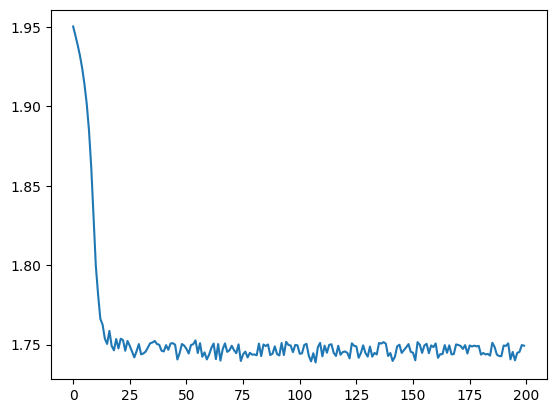

In [ ]:
plt.plot(catdeath_train_loss)

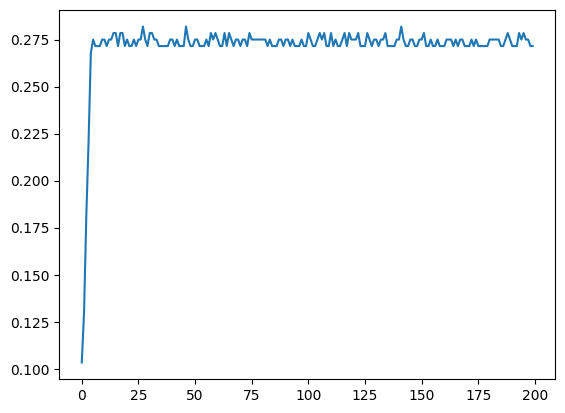

In [ ]:
plt.plot(catdeath_train_acc)

In [ ]:
nclf_death.eval()
loss_list = []
acc_list = []
catdeath_pred = np.array([])

for x, y in tqdm(test_loader_death, desc="testing"):
    pred = nclf_death(x.to(device))
    catdeath_pred = np.concatenate((catdeath_pred, pred.argmax(dim = 1).detach().numpy()))

    loss = loss_func(pred, y.to(device))
    acc = accuracy_score(pred.argmax(dim = 1), y.to(device))
    loss_list.append(loss.item())
    acc_list.append(acc.item())

catdeath_test_loss = sum(loss_list) / len(loss_list)
catdeath_test_acc = sum(acc_list) / len(acc_list)

testing:   0%|          | 0/22 [00:00<?, ?it/s]

In [ ]:
catdeath_test_loss

1.6977658434347673

In [ ]:
catdeath_test_acc

0.3130848930481283

#### SVM

In [91]:
BestSVM.fit(X_train, y_train)

Fitting 3 folds for each of 5 candidates, totalling 15 fits


/usr/local/lib/python3.10/dist-packages/joblib/externals/loky/backend/fork_exec.py:38: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid = os.fork()


GridSearchCV(cv=3, estimator=SVC(kernel='poly'), n_jobs=-1,
             param_grid={'C': [0.1, 1, 10, 100, 1000]}, scoring='accuracy',
             verbose=1)

In [92]:
print(BestSVM.best_score_)
print(BestSVM.best_params_)

0.28445850914205345
{'C': 0.1}


In [93]:
catdeathSVM_acc = cross_val_score(
    estimator = svm.SVC(kernel='poly', **BestSVM.best_params_),
    X = X_train,
    y = y_train,
    scoring = 'accuracy',
    cv = kfold)

In [95]:
catdeathSVM_pred = BestSVM.predict(X_test)
catdeathSVM_test_acc = accuracy_score(catdeathSVM_pred, y_catdeath_test)

In [96]:
catdeathSVM_test_acc

0.2893258426966292

#### XGBoost classifier

In [ ]:
BestXGBC = GridSearchCV(
    estimator = XGBClassifier(importance_type = 'gain'),
    param_grid = xg_param,
    scoring = 'accuracy',
    cv = stratifiedCV,
    verbose = 1,
    n_jobs = -1
)

In [ ]:
BestXGBC.fit(X_train, y_train)

Fitting 3 folds for each of 36 candidates, totalling 108 fits


/usr/local/lib/python3.10/dist-packages/joblib/externals/loky/backend/fork_exec.py:38: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid = os.fork()


GridSearchCV(cv=StratifiedKFold(n_splits=3, random_state=None, shuffle=False),
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     grow_policy=None, importance_...
                                     max_cat_to_onehot=None,
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=None,
                                     n_jobs=None, num_parallel_tree=None,
                                     random_state=None, ...),
             n_jobs=-1,
             param_grid={'learning_rate': [0.001, 0.01, 0.1],
                         'max_depth': [2, 3, 4, 5],
                         'n_estimators': [200, 500, 1000]},
             scoring='accuracy', verbose=1)

In [ ]:
print(BestXGBC.best_score_)
print(BestXGBC.best_params_)

0.27113989109124487
{'learning_rate': 0.01, 'max_depth': 2, 'n_estimators': 200}


In [ ]:
catdeathXGBC_acc = cross_val_score(
    estimator = XGBClassifier(importance_type = 'gain', **BestXGBC.best_params_),
    X = X_train,
    y = y_train,
    scoring = 'accuracy',
    cv = kfold)

In [ ]:
catdeathXGBC_pred = BestXGBC.predict(X_test)
catdeathXGBC_test_acc = accuracy_score(catdeath_pred, y_catdeath_test)

#### RF classfier

In [ ]:
BestRFC = GridSearchCV(
    estimator = RandomForestClassifier(criterion = 'entropy', class_weight = 'balanced'),
    param_grid = rf_param,
    scoring = 'accuracy',
    cv = stratifiedCV,
    verbose = 1,
    n_jobs = -1
)

In [ ]:
BestRFC.fit(X_train, y_train)

Fitting 3 folds for each of 35 candidates, totalling 105 fits


GridSearchCV(cv=StratifiedKFold(n_splits=3, random_state=None, shuffle=False),
             estimator=RandomForestClassifier(class_weight='balanced',
                                              criterion='entropy'),
             n_jobs=-1,
             param_grid={'max_depth': array([4, 5, 6, 7, 8]),
                         'n_estimators': array([30, 40, 50, 60, 70, 80, 90])},
             scoring='accuracy', verbose=1)

In [ ]:
print(BestRFC.best_score_)
print(BestRFC.best_params_)

0.2152476998537294
{'max_depth': 8, 'n_estimators': 50}


In [ ]:
catdeathRF_acc = cross_val_score(
    estimator = RandomForestClassifier(criterion = 'entropy', class_weight = 'balanced', **BestRFC.best_params_),
    X = X_train,
    y = y_train,
    scoring = "accuracy",
    cv = kfold
)

In [ ]:
catdeathRF_pred = BestRFC.predict(X_test)
catdeathRF_test_acc = accuracy_score(catdeathRF_pred, y_catdeath_test)

### group: discharge

In [97]:
X_train, X_test, y_train, y_catdischarge_test = train_test_split(embedding_discharge, y_discharge, test_size = 0.2, random_state = seed)

train_discharge = icuDataset(X_train, y_train)
test_discharge = icuDataset(X_test, y_catdischarge_test)

train_loader_discharge = DataLoader(train_discharge, batch_size=64, shuffle=True)
test_loader_discharge = DataLoader(test_discharge, batch_size=64, shuffle=False)

#### Neural network

In [ ]:
loss_func = nn.CrossEntropyLoss(weight = torch.tensor(weight_discharge, dtype = torch.float32).to(device))

nclf_discharge = nClassifier().to(device)

opt = optim.SGD(list(nclf_discharge.parameters()), lr=learning_rate)

In [ ]:
catdischarge_train_loss = []
catdischarge_train_acc = []

for epoch in range(1, 1+num_epochs):
    nclf_discharge.train()
    loss_list = []
    acc_list = []

    for x, y in tqdm(train_loader_discharge, desc=f"training epoch #{epoch}"):
        opt.zero_grad()   # drop the direction of the gradient
        pred = nclf_discharge(x.to(device))   # prediction
        loss = loss_func(pred, y.to(device))
        acc = accuracy_score(pred.argmax(dim = 1), y.to(device))

        loss.backward()     # calculate the gradient
        opt.step()      # update the best gradient
        loss_list.append(loss.item())
        acc_list.append(acc.item())

    epoch_loss = sum(loss_list) / len(loss_list)
    epoch_acc = sum(acc_list) / len(acc_list)
    catdischarge_train_loss.append(epoch_loss)
    catdischarge_train_acc.append(epoch_acc)

training epoch #1:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #2:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #3:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #4:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #5:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #6:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #7:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #8:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #9:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #10:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #11:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #12:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #13:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #14:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #15:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #16:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #17:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #18:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #19:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #20:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #21:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #22:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #23:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #24:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #25:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #26:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #27:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #28:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #29:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #30:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #31:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #32:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #33:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #34:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #35:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #36:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #37:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #38:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #39:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #40:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #41:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #42:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #43:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #44:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #45:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #46:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #47:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #48:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #49:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #50:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #51:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #52:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #53:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #54:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #55:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #56:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #57:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #58:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #59:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #60:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #61:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #62:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #63:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #64:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #65:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #66:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #67:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #68:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #69:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #70:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #71:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #72:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #73:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #74:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #75:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #76:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #77:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #78:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #79:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #80:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #81:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #82:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #83:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #84:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #85:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #86:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #87:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #88:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #89:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #90:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #91:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #92:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #93:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #94:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #95:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #96:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #97:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #98:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #99:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #100:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #101:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #102:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #103:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #104:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #105:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #106:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #107:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #108:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #109:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #110:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #111:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #112:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #113:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #114:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #115:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #116:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #117:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #118:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #119:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #120:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #121:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #122:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #123:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #124:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #125:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #126:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #127:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #128:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #129:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #130:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #131:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #132:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #133:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #134:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #135:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #136:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #137:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #138:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #139:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #140:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #141:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #142:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #143:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #144:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #145:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #146:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #147:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #148:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #149:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #150:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #151:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #152:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #153:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #154:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #155:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #156:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #157:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #158:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #159:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #160:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #161:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #162:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #163:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #164:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #165:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #166:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #167:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #168:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #169:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #170:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #171:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #172:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #173:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #174:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #175:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #176:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #177:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #178:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #179:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #180:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #181:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #182:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #183:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #184:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #185:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #186:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #187:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #188:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #189:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #190:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #191:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #192:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #193:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #194:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #195:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #196:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #197:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #198:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #199:   0%|          | 0/197 [00:00<?, ?it/s]

training epoch #200:   0%|          | 0/197 [00:00<?, ?it/s]

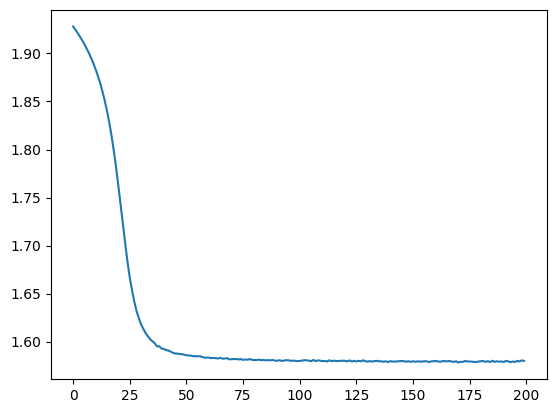

In [ ]:
plt.plot(catdischarge_train_loss)

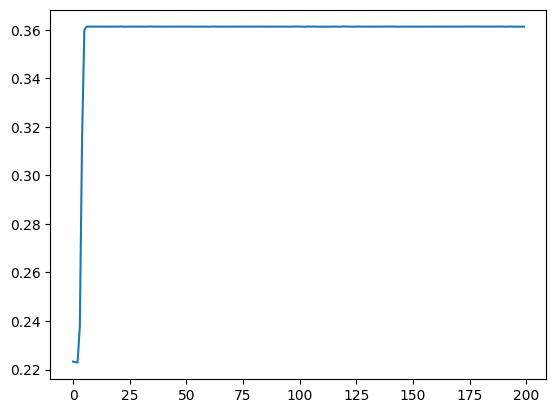

In [ ]:
plt.plot(catdischarge_train_acc)

In [ ]:
nclf_discharge.eval()
loss_list = []
acc_list = []
catdischarge_pred = np.array([])

for x, y in tqdm(test_loader_discharge, desc="testing"):
    pred = nclf_discharge(x.to(device))
    catdischarge_pred = np.concatenate((catdischarge_pred, pred.argmax(dim = 1).detach().numpy()))

    loss = loss_func(pred, y.to(device))
    acc = accuracy_score(pred.argmax(dim = 1), y.to(device))
    loss_list.append(loss.item())
    acc_list.append(acc.item())

catdischarge_test_loss = sum(loss_list) / len(loss_list)
catdischarge_test_acc = sum(acc_list) / len(acc_list)

testing:   0%|          | 0/50 [00:00<?, ?it/s]

In [ ]:
catdischarge_test_loss

1.5886182808876037

In [ ]:
catdischarge_test_acc

0.35110416666666666

#### SVM

In [98]:
BestSVM.fit(X_train, y_train)

Fitting 3 folds for each of 5 candidates, totalling 15 fits


GridSearchCV(cv=3, estimator=SVC(kernel='poly'), n_jobs=-1,
             param_grid={'C': [0.1, 1, 10, 100, 1000]}, scoring='accuracy',
             verbose=1)

In [99]:
print(BestSVM.best_score_)
print(BestSVM.best_params_)

0.3591177735078816
{'C': 0.1}


In [100]:
catdischargeSVM_acc = cross_val_score(
    estimator = svm.SVC(kernel='poly', **BestSVM.best_params_),
    X = X_train,
    y = y_train,
    scoring = 'accuracy',
    cv = kfold)

In [101]:
catdischargeSVM_pred = BestSVM.predict(X_test)
catdischargeSVM_test_acc = accuracy_score(catdischargeSVM_pred, y_catdischarge_test)

In [102]:
catdischargeSVM_test_acc

0.3598593799936082

#### XGBoost classifier

In [ ]:
BestXGBC = GridSearchCV(
    estimator = XGBClassifier(importance_type = 'gain'),
    param_grid = xg_param,
    scoring = 'accuracy',
    cv = stratifiedCV,
    verbose = 1,
    n_jobs = -1
)

In [ ]:
BestXGBC.fit(X_train, y_train)

Fitting 3 folds for each of 36 candidates, totalling 108 fits


/usr/local/lib/python3.10/dist-packages/joblib/externals/loky/backend/fork_exec.py:38: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid = os.fork()


GridSearchCV(cv=StratifiedKFold(n_splits=3, random_state=None, shuffle=False),
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     grow_policy=None, importance_...
                                     max_cat_to_onehot=None,
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=None,
                                     n_jobs=None, num_parallel_tree=None,
                                     random_state=None, ...),
             n_jobs=-1,
             param_grid={'learning_rate': [0.001, 0.01, 0.1],
                         'max_depth': [2, 3, 4, 5],
                         'n_estimators': [200, 500, 1000]},
             scoring='accuracy', verbose=1)

In [ ]:
print(BestXGBC.best_score_)
print(BestXGBC.best_params_)

0.3612344703253001
{'learning_rate': 0.001, 'max_depth': 2, 'n_estimators': 500}


In [ ]:
catdischargeXGBC_acc = cross_val_score(
    estimator = XGBClassifier(importance_type = 'gain', **BestXGBC.best_params_),
    X = X_train,
    y = y_train,
    scoring = 'accuracy',
    cv = kfold)

In [ ]:
catdischargeXGBC_pred = BestXGBC.predict(X_test)
catdischargeXGBC_test_acc = accuracy_score(catdischargeXGBC_pred, y_catdischarge_test)

#### RF Classifier

In [ ]:
BestRFC = GridSearchCV(
    estimator = RandomForestClassifier(criterion = 'entropy', class_weight = 'balanced'),
    param_grid = rf_param,
    scoring = 'accuracy',
    cv = stratifiedCV,
    verbose = 1,
    n_jobs = -1
)

In [ ]:
BestRFC.fit(X_train, y_train)

Fitting 3 folds for each of 35 candidates, totalling 105 fits


GridSearchCV(cv=StratifiedKFold(n_splits=3, random_state=None, shuffle=False),
             estimator=RandomForestClassifier(class_weight='balanced',
                                              criterion='entropy'),
             n_jobs=-1,
             param_grid={'max_depth': array([4, 5, 6, 7, 8]),
                         'n_estimators': array([30, 40, 50, 60, 70, 80, 90])},
             scoring='accuracy', verbose=1)

In [ ]:
print(BestRFC.best_score_)
print(BestRFC.best_params_)

0.24476304777429791
{'max_depth': 8, 'n_estimators': 90}


In [ ]:
catdischargeRF_acc = cross_val_score(
    estimator = RandomForestClassifier(criterion = 'entropy', class_weight = 'balanced', **BestRFC.best_params_),
    X = X_train,
    y = y_train,
    scoring = 'accuracy',
    cv = kfold
)

In [ ]:
catdischargeRF_pred = BestRFC.predict(X_test)
catdischargeRF_test_acc = accuracy_score(catdischargeRF_pred, y_catdischarge_test)

## Visualization of model performance

### boxplots

In [ ]:
train_con_results = {
    'training MSE': np.concatenate((br_train_loss[-10:], baseXGBR_mse,
                baseRFR_mse, condeath_train_loss[-10:],
                condeathXGBR_mse, condeathRFR_mse,
                br_train_loss[-10:], baseXGBR_mse,
                baseRFR_mse, condischarge_train_loss[-10:],
                condischargeXGBR_mse, condischargeRFR_mse)),
    'model': np.tile(np.concatenate((np.repeat('DNN', 10), np.repeat('XGB', 10),
                     np.repeat('RF', 10),
                     np.repeat('embedding + DNN', 10),
                     np.repeat('embedding + XGB', 10),
                     np.repeat('embedding + RF', 10))), 2),
    'status': np.concatenate((np.repeat('death', 60), np.repeat('discharge', 60)))
    }

df = pd.DataFrame(train_con_results)
df['training MSE'] = np.abs(df['training MSE'])
df.to_csv('Experiments/train_con_results.csv', index = False)

([0, 1, 2, 3, 4, 5],
 [Text(0, 0, 'DNN'),
  Text(1, 0, 'XGB'),
  Text(2, 0, 'RF'),
  Text(3, 0, 'embedding + DNN'),
  Text(4, 0, 'embedding + XGB'),
  Text(5, 0, 'embedding + RF')])

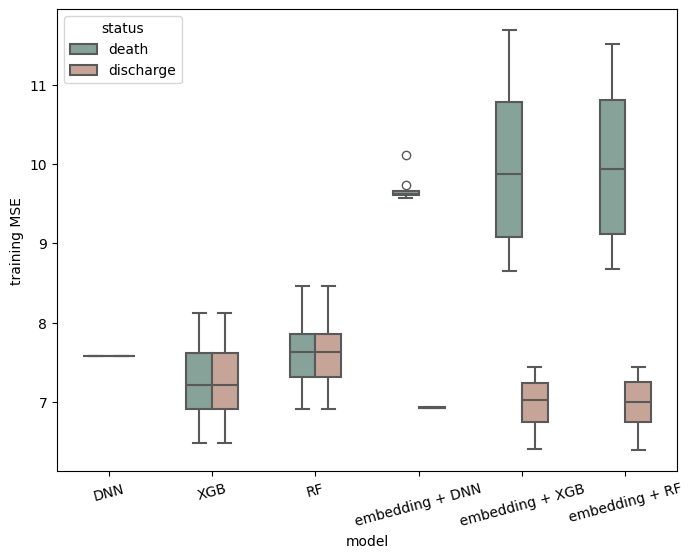

In [ ]:
plt.figure(figsize = (8, 6))
sns.boxplot(x = 'model', y = 'training MSE', data = df, hue = 'status',
            palette = 'Set2', width = 0.5,
            linewidth = 1.5, saturation = 0.3)
plt.xticks(rotation = 15)
# plt.axhline(xmin = 0.025, xmax = 0.975, y = br_train_loss[-1], color = ''label = 'baseline')
# plt.axhline(xmin = 0, xmax = 1, y = condeath_train_loss[-1], color = )

In [ ]:
train_cat_results = {
    'training accuracy': np.concatenate((bc_train_acc[-10:], baseXGBC_acc,
                baseRFC_acc, catdeath_train_acc[-10:],
                catdeathXGBC_acc, catdeathRF_acc,
                bc_train_acc[-10:], baseXGBC_acc,
                baseRFC_acc, catdischarge_train_acc[-10:],
                catdischargeXGBC_acc, catdischargeRF_acc)),
    'model': np.tile(np.concatenate((np.repeat('DNN', 10), np.repeat('XGB', 10),
                     np.repeat('RF', 10),
                     np.repeat('embedding + DNN', 10),
                     np.repeat('embedding + XGB', 10),
                     np.repeat('embedding + RF', 10))), 2),
    'status': np.concatenate((np.repeat('death', 60), np.repeat('discharge', 60)))
    }

df = pd.DataFrame(train_cat_results)
df['training accuracy'] = np.abs(df['training accuracy'])
df.to_csv('Experiments/train_cat_results.csv', index = False)

([0, 1, 2, 3, 4, 5],
 [Text(0, 0, 'DNN'),
  Text(1, 0, 'XGB'),
  Text(2, 0, 'RF'),
  Text(3, 0, 'embedding + DNN'),
  Text(4, 0, 'embedding + XGB'),
  Text(5, 0, 'embedding + RF')])

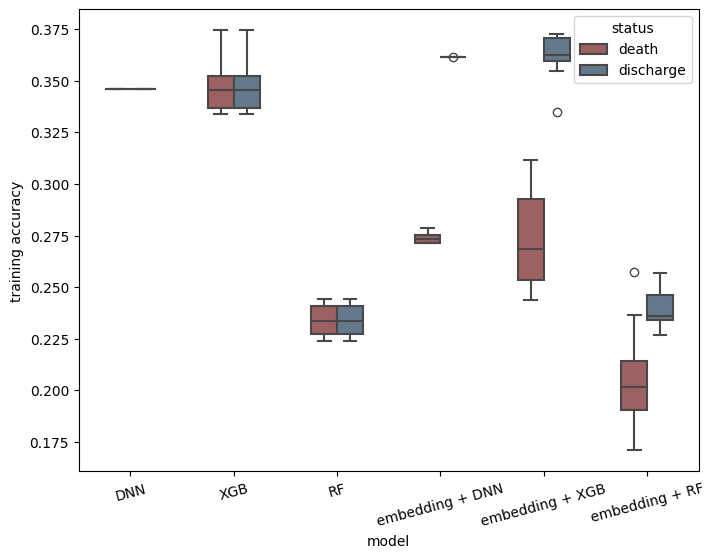

In [ ]:
plt.figure(figsize = (8, 6))
sns.boxplot(x = 'model', y = 'training accuracy', data = df, hue = 'status',
            palette = 'Set1', width = 0.5,
            linewidth = 1.5, saturation = 0.3)
plt.xticks(rotation = 15)

In [ ]:
test_death_mse = [br_test_loss, baseXGBR_test_mse, baseRFR_test_mse, condeath_test_loss,
          condeathXGBR_test_mse, condeathRFR_test_mse]

test_discharge_mse = [br_test_loss, baseXGBR_test_mse, baseRFR_test_mse, condischarge_test_loss,
            condischargeXGBR_test_mse, condischargeRFR_test_mse]

test_death_acc = [bc_test_acc, baseXGBC_test_acc, baseRFC_test_acc, catdeath_test_acc,
          catdeathXGBC_test_acc, catdeathRF_test_acc]

test_discharge_acc = [bc_test_acc, baseXGBC_test_acc, baseRFC_test_acc, catdischarge_test_acc,
            catdischargeXGBC_test_acc, catdischargeRF_test_acc]

model = ['DNN', 'XGB', "RF", 'embedding + DNN', 'embedding + XGB', 'embedding + RF']

In [ ]:
test_con_results = {
    'testing MSE': np.concatenate((test_death_mse, test_discharge_mse)),
    'model': np.tile(model, 2),
    'status': np.concatenate((np.repeat('death', 6), np.repeat('discharge', 6)))
}

df = pd.DataFrame(test_con_results)
df.to_csv('Experiments/test_con_results.csv', index = False)

In [ ]:
test_cat_results = {
    'testing MSE': np.concatenate((test_death_acc, test_discharge_acc)),
    'model': np.tile(model, 2),
    'status': np.concatenate((np.repeat('death', 6), np.repeat('discharge', 6)))
}

df = pd.DataFrame(test_cat_results)
df.to_csv('Experiments/test_cat_results.csv', index = False)

<ipython-input-224-a3a06af26395>:8: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.autofmt_xdate(rotation = 15)


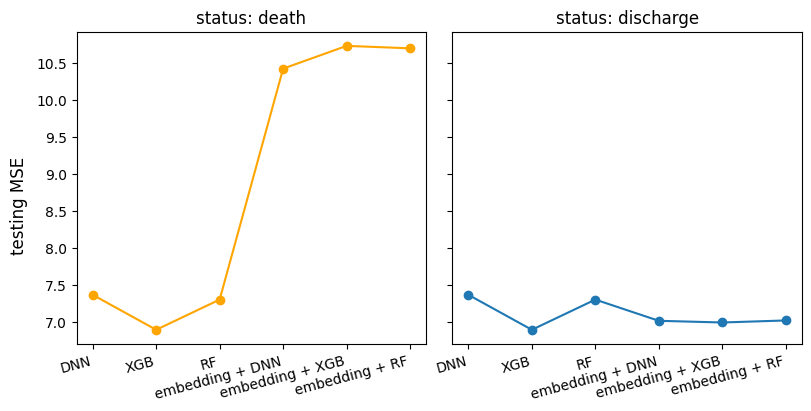

In [ ]:
fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize = (8, 4), sharey = True, constrained_layout = True)

ax[0].plot(model, test_death_mse, 'o-', color = 'orange')
ax[0].set_title('status: death')
ax[1].plot(model, test_discharge_mse, 'o-')
ax[1].set_title('status: discharge')
fig.supylabel('testing MSE')
fig.autofmt_xdate(rotation = 15)

<ipython-input-225-367cf645f36a>:8: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.autofmt_xdate(rotation = 15)


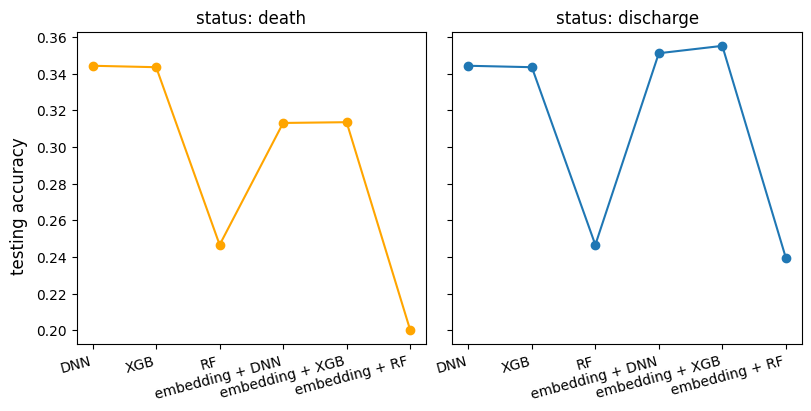

In [ ]:
fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize = (8, 4), sharey = True, constrained_layout = True)

ax[0].plot(model, test_death_acc, 'o-', color = 'orange')
ax[0].set_title('status: death')
ax[1].plot(model, test_discharge_acc, 'o-')
ax[1].set_title('status: discharge')
fig.supylabel('testing accuracy')
fig.autofmt_xdate(rotation = 15)

<ipython-input-246-226bbc21e126>:1: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  fig = sns.kdeplot(y_condeath_test, shade = True, color = 'blue', label = 'ground truth')
<ipython-input-246-226bbc21e126>:2: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  fig = sns.kdeplot(condeath_pred, shade = True, color = "red", label = "embedding + DNN")
<ipython-input-246-226bbc21e126>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  fig = sns.kdeplot(condeathXGBR_pred, shade = True, color = 'orange', label = 'embedding + XGB')
<ipython-input-246-226bbc21e126>:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an erro

Text(0.5, 1.0, 'distribution of predictions')

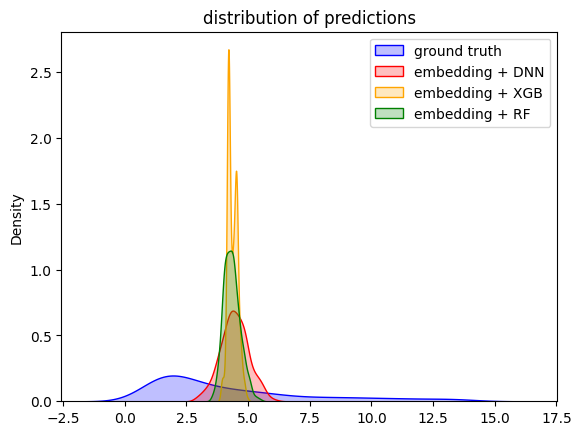

In [ ]:
fig = sns.kdeplot(y_condeath_test, shade = True, color = 'blue', label = 'ground truth')
fig = sns.kdeplot(condeath_pred, shade = True, color = "red", label = "embedding + DNN")
fig = sns.kdeplot(condeathXGBR_pred, shade = True, color = 'orange', label = 'embedding + XGB')
fig = sns.kdeplot(condeathRFR_pred, shade = True, color = 'green', label = 'embedding + RF')
fig.legend()
fig.set_xlabel('icu duration')
plt.title("status: death")

<ipython-input-259-a805b39e64ac>:1: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  fig = sns.kdeplot(y_condischarge_test, shade = True, color = 'blue', label = 'ground truth')
<ipython-input-259-a805b39e64ac>:2: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  fig = sns.kdeplot(condischarge_pred, shade = True, color = "red", label = "embedding + DNN")
<ipython-input-259-a805b39e64ac>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  fig = sns.kdeplot(condischargeXGBR_pred, shade = True, color = 'orange', label = 'embedding + XGB')
<ipython-input-259-a805b39e64ac>:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will be

Text(0.5, 1.0, 'status: discharge')

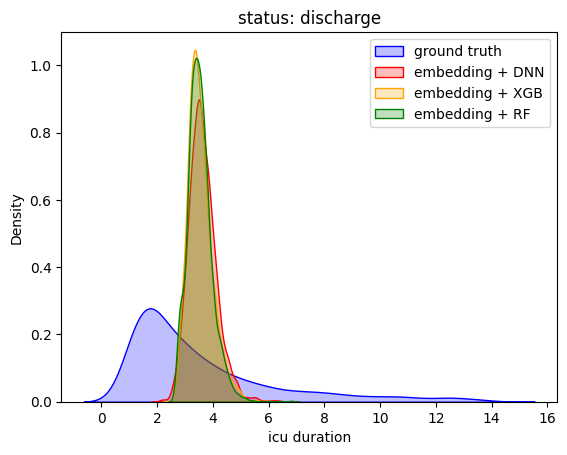

In [ ]:
fig = sns.kdeplot(y_condischarge_test, shade = True, color = 'blue', label = 'ground truth')
fig = sns.kdeplot(condischarge_pred, shade = True, color = "red", label = "embedding + DNN")
fig = sns.kdeplot(condischargeXGBR_pred, shade = True, color = 'orange', label = 'embedding + XGB')
fig = sns.kdeplot(condischargeRFR_pred, shade = True, color = 'green', label = 'embedding + RF')
fig.legend()
fig.set_xlabel('icu duration')
plt.title("status: discharge")

In [ ]:
# torch.save(br.state_dict(), 'models/br.pth')
# torch.save(bc.state_dict(), 'models/bc.pth')
# torch.save(encoder.state_dict(), 'models/encoder.pth')
# torch.save(clf.state_dict(), 'models/clf.pth')
# torch.save(reg_death.state_dict(), 'models/reg_death.pth')
# torch.save(reg_discharge.state_dict(), 'models/reg_discharge.pth')
# torch.save(nclf_death.state_dict(), 'models/nclf_death.pth')
# torch.save(nclf_discharge.state_dict(), 'models/nclf_discharge.pth')